In [1]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

In [141]:
from __future__ import absolute_import, division, print_function, unicode_literals

# TensorFlow and tf.keras
import tensorflow as tf
from tensorflow import keras

import numpy as np
from scipy import special
import pickle
import time
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
from itertools import product, combinations

In [189]:
rho = 1
L = 7.93701/(rho**(1/3))
l = 6
d = 1.5/(rho**(1/3))
c = 0.5
t = 7
model = 'solid_or_liquid_with_quench.h5'
file = 'solid.xyz'
test_labels = np.full(500,1)

In [145]:
#function to find vector between 2 co-ordinates a and b, length of box L,rec 1/L
def find_vector(a,b,L):
    c=b-a
        
    d=c/L

    #ensure each component of reduced vector <=0.5
    d=d-np.floor(d+0.5)

    r = d*L
    return r

In [146]:
#function to find list of parameters for this configuration of coordinates
#takes in coords, l quantum number, L (length of box),rec = 1/L
#and cut-off distance for nearest-neighbour bonds d
def find_param(coords,l,L,d):    
    myrange=range(-l,l+1)
    param = []
    neighbours = []
    #find parameter for each particle a
    for i, a in enumerate(coords):
        sph_harm=[]
        n=[]
        #loop over all particles b for each particle a
        for j, b in enumerate(coords):
            #if a==b, don't use particle b 
            if i!=j:
                    
                r=find_vector(a,b,L)

                #check if particle b is nearest neighbour to a
                if np.dot(r,r)<=d**2:
                    #append nearest neighbours to new list
                    n.append(j)
                    #construct spherical harmonic
                    theta = np.arctan2(r[1],r[0])
                    phi = np.arccos(r[2]/np.linalg.norm(r))               
                    new_vec = np.array([special.sph_harm(m,l,theta,phi) for m in myrange]) 
                    
                    #append spherical harmonic to new list and carry on loop
                    sph_harm.append(new_vec)
                
        #find parameter for particle a and append to parameters list
        #append all neighbours to new list
        neighbours.append(n)
        total = sum(sph_harm)
        N=len(sph_harm)
        p = total/N
        P=p.tolist()
        param.append(P)

    #write parameters to seperate file to be used for machine learning
    #with open('liquidT1.8_1.txt','ab') as file:
    #    pickle.dump(param,file)
    return param, neighbours

In [147]:
#function to create the descriptors for use within the neural network
def create_desc(param):
    D = [sublist for sublist in param]
    test=[]

    for item in D:
        new_g = []
        for k in item:
            new_g.append(np.real(k))
            new_g.append(np.imag(k))
        test.append(new_g)
    test_data = np.array(test)
    return test_data

In [179]:
#function to evaluate accuracy and make predictions on test data, and seperate solid and liquid particles for plotting
def make_predictions(desc,coordinates):
    solid_or_liquid = keras.models.load_model(model)
    test_loss, test_acc = solid_or_liquid.evaluate(desc, test_labels, verbose=2)
    predictions = solid_or_liquid.predict(desc)

    solid_coords=[]
    liquid_coords=[]
    for i, value in enumerate(coordinates):
        if np.argmax(predictions[i])==1:
            solid_coords.append(value)
        else:
            liquid_coords.append(value)
    return solid_coords, liquid_coords,test_acc

In [180]:
#function to plot crystals, solid particles in red and liquid particles in blue, with a cube around it to indicate boundaries
def plot_crystal(solid_coords,liquid_coords):
    fig = plt.figure()
    ax = plt.axes(projection="3d")
    solid_x=[]
    solid_y=[]
    solid_z=[]
    for e,f,g in solid_coords:
        solid_x.append(e)
        solid_y.append(f)
        solid_z.append(g)
    liquid_x=[]
    liquid_y=[]
    liquid_z=[]
    for m,n,o in liquid_coords:
        liquid_x.append(m)
        liquid_y.append(n)
        liquid_z.append(o)
    ax.scatter3D(solid_x,solid_y,solid_z,s=70,color='red')
    ax.scatter3D(liquid_x,liquid_y,liquid_z,s=70,color='blue')
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    # draw cube
    r = [0, L]
    for s, e in combinations(np.array(list(product(r, r, r))), 2):
        if np.sum(np.abs(s-e)) == r[1]-r[0]:
            ax.plot3D(*zip(s, e), color="black")
    plt.show()
    return

In [191]:
#function which takes in files and some parameters, creates descriptors for neural network, makes predictions on particles
#and produces colour coded plots. The data can be saved from here to be plotted outside the jupyter notebook using Mayavi
def sol_or_liq(file,l,L,d,c,t):
    start = time.time()
    total_descriptor_time =0
    total_class_time=0
    j=1
    all_coords =[]
    all_desc=[]
    xyz = open(file)
    accuracy=[]
    #loop over all 101 configurations
    while j<=101:
        atoms = []
        coordinates = []
        try:
            n_atoms = int(xyz.readline())
        except:
            print("End of file reached")
            break
        
        comment = xyz.readline()
        #read through files and puts coordinates into array
        for line in xyz:
            atom,x,y,z = line.split()
            atoms.append(atom)
            coordinates.append(np.array([float(x), float(y), float(z)]))
            if len(coordinates)==n_atoms:
                break
        all_coords.append(coordinates)
        s1 = time.time()
        #create descriptors
        parameters, neighbours = find_param(coordinates,l,L,d)
        descriptors=create_desc(parameters)
        e1 = time.time()
        t1 = e1-s1    
        total_descriptor_time+=t1
        all_desc.append(descriptors)
        s2=time.time()
        #Evaluate accuracy and make predictions on data
        sc,lc,test_acc = make_predictions(descriptors,coordinates)
        e2=time.time()
        t2=e2-s2
        total_class_time+=t2
        print('\nTest accuracy:', test_acc)
        accuracy.append(test_acc)
        plot_crystal(sc,lc)
        print('Processed configuration {}. Timestamp = {}'.format(j, comment))
        j+=1
    xyz.close()
    end = time.time()
    total_time = end-start
    print('Total time to constructs descriptors = {} s. Total time to make predictions = {} s.'.format(total_descriptor_time,total_class_time))
    print('Average test accuracy = {}'.format(sum(accuracy)/len(accuracy)))
    return sc,lc

500/1 - 0s - loss: 1.0042 - accuracy: 0.5620

Test accuracy: 0.562


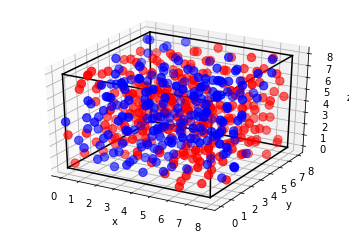

Processed configuration 1. Timestamp = Atoms. Timestep: 100000

500/1 - 0s - loss: 0.9083 - accuracy: 0.6000

Test accuracy: 0.6


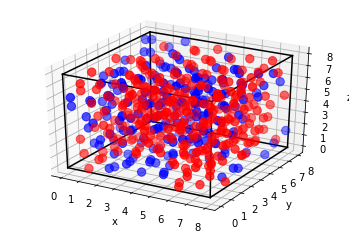

Processed configuration 2. Timestamp = Atoms. Timestep: 100500

500/1 - 1s - loss: 1.1434 - accuracy: 0.5840

Test accuracy: 0.584


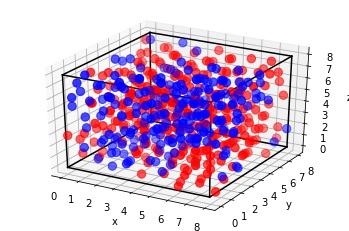

Processed configuration 3. Timestamp = Atoms. Timestep: 101000

500/1 - 0s - loss: 1.1641 - accuracy: 0.5740

Test accuracy: 0.574


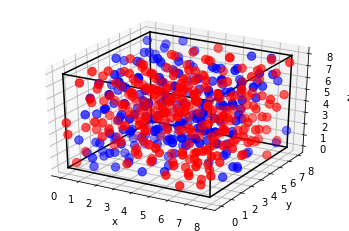

Processed configuration 4. Timestamp = Atoms. Timestep: 101500

500/1 - 0s - loss: 1.0173 - accuracy: 0.6380

Test accuracy: 0.638


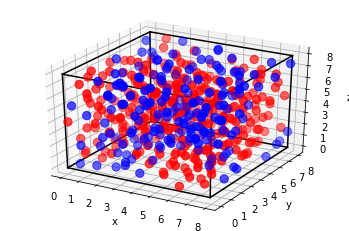

Processed configuration 5. Timestamp = Atoms. Timestep: 102000

500/1 - 0s - loss: 0.9989 - accuracy: 0.6440

Test accuracy: 0.644


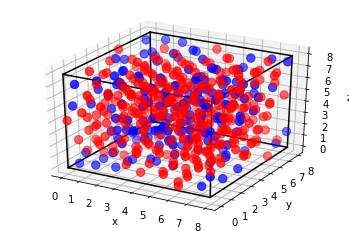

Processed configuration 6. Timestamp = Atoms. Timestep: 102500

500/1 - 0s - loss: 1.2098 - accuracy: 0.6200

Test accuracy: 0.62


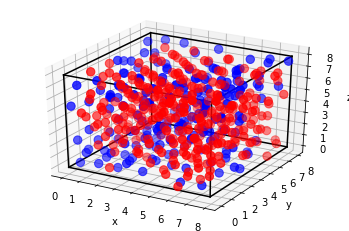

Processed configuration 7. Timestamp = Atoms. Timestep: 103000

500/1 - 0s - loss: 0.9750 - accuracy: 0.6180

Test accuracy: 0.618


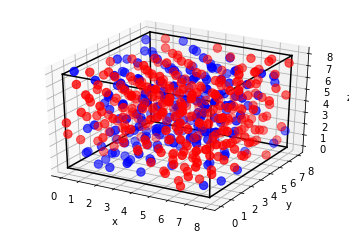

Processed configuration 8. Timestamp = Atoms. Timestep: 103500

500/1 - 0s - loss: 0.9222 - accuracy: 0.6280

Test accuracy: 0.628


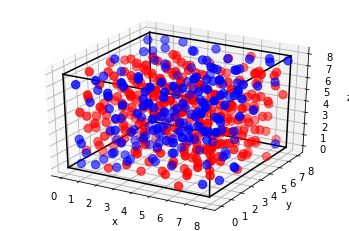

Processed configuration 9. Timestamp = Atoms. Timestep: 104000

500/1 - 0s - loss: 0.9940 - accuracy: 0.6100

Test accuracy: 0.61


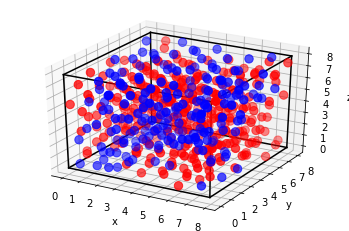

Processed configuration 10. Timestamp = Atoms. Timestep: 104500

500/1 - 0s - loss: 1.0199 - accuracy: 0.5900

Test accuracy: 0.59


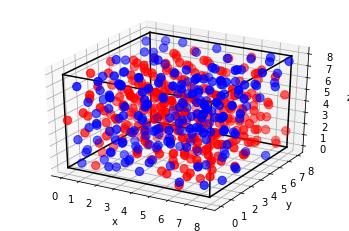

Processed configuration 11. Timestamp = Atoms. Timestep: 105000

500/1 - 0s - loss: 0.9867 - accuracy: 0.6080

Test accuracy: 0.608


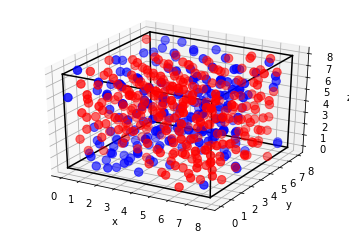

Processed configuration 12. Timestamp = Atoms. Timestep: 105500

500/1 - 0s - loss: 0.9832 - accuracy: 0.6200

Test accuracy: 0.62


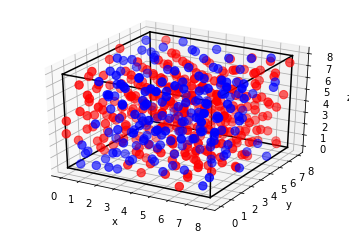

Processed configuration 13. Timestamp = Atoms. Timestep: 106000

500/1 - 0s - loss: 1.0394 - accuracy: 0.6100

Test accuracy: 0.61


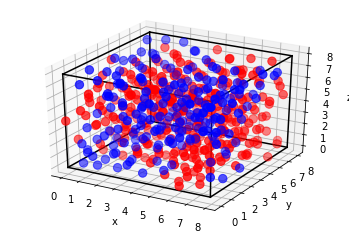

Processed configuration 14. Timestamp = Atoms. Timestep: 106500

500/1 - 0s - loss: 0.8716 - accuracy: 0.6560

Test accuracy: 0.656


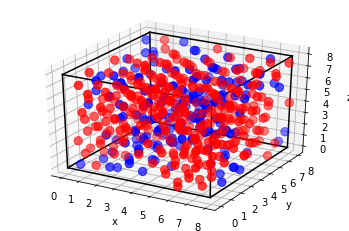

Processed configuration 15. Timestamp = Atoms. Timestep: 107000

500/1 - 0s - loss: 0.9172 - accuracy: 0.6380

Test accuracy: 0.638


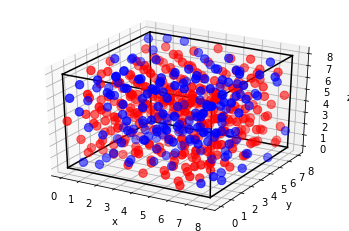

Processed configuration 16. Timestamp = Atoms. Timestep: 107500

500/1 - 0s - loss: 0.8612 - accuracy: 0.6300

Test accuracy: 0.63


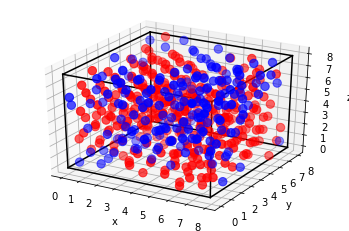

Processed configuration 17. Timestamp = Atoms. Timestep: 108000

500/1 - 0s - loss: 0.8335 - accuracy: 0.6820

Test accuracy: 0.682


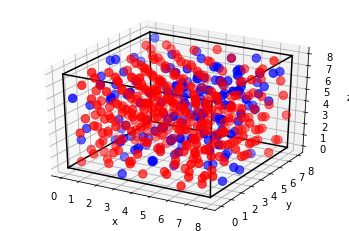

Processed configuration 18. Timestamp = Atoms. Timestep: 108500

500/1 - 0s - loss: 0.7889 - accuracy: 0.7040

Test accuracy: 0.704


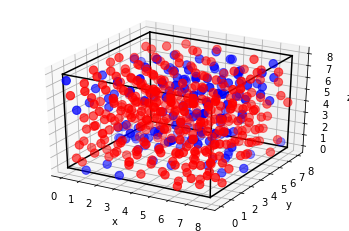

Processed configuration 19. Timestamp = Atoms. Timestep: 109000

500/1 - 0s - loss: 0.9618 - accuracy: 0.6960

Test accuracy: 0.696


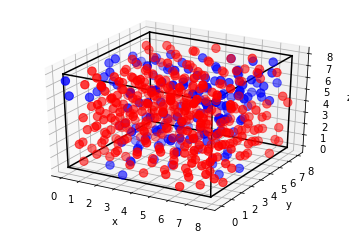

Processed configuration 20. Timestamp = Atoms. Timestep: 109500

500/1 - 1s - loss: 0.6890 - accuracy: 0.6880

Test accuracy: 0.688


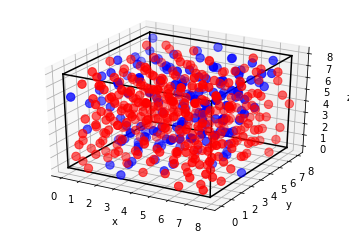

Processed configuration 21. Timestamp = Atoms. Timestep: 110000

500/1 - 0s - loss: 0.7086 - accuracy: 0.6780

Test accuracy: 0.678


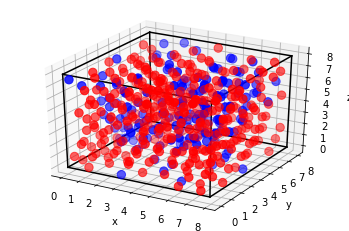

Processed configuration 22. Timestamp = Atoms. Timestep: 110500

500/1 - 0s - loss: 0.7475 - accuracy: 0.6920

Test accuracy: 0.692


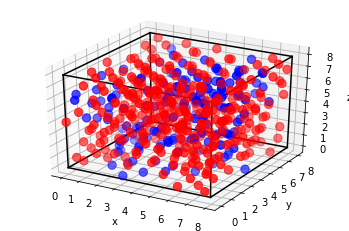

Processed configuration 23. Timestamp = Atoms. Timestep: 111000

500/1 - 0s - loss: 0.7305 - accuracy: 0.7500

Test accuracy: 0.75


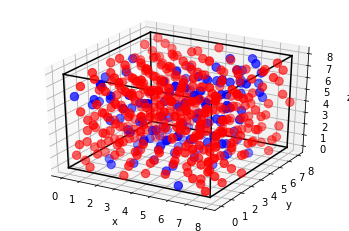

Processed configuration 24. Timestamp = Atoms. Timestep: 111500

500/1 - 0s - loss: 0.8185 - accuracy: 0.7360

Test accuracy: 0.736


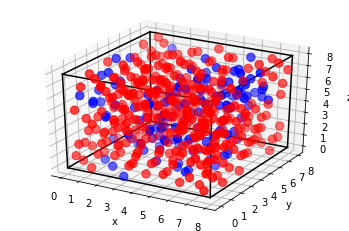

Processed configuration 25. Timestamp = Atoms. Timestep: 112000

500/1 - 0s - loss: 0.3976 - accuracy: 0.7620

Test accuracy: 0.762


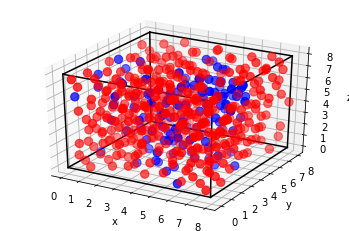

Processed configuration 26. Timestamp = Atoms. Timestep: 112500

500/1 - 0s - loss: 0.6671 - accuracy: 0.7800

Test accuracy: 0.78


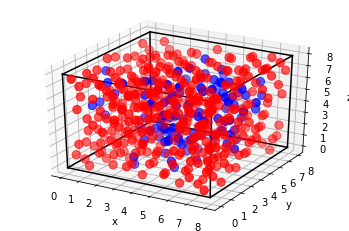

Processed configuration 27. Timestamp = Atoms. Timestep: 113000

500/1 - 0s - loss: 0.4440 - accuracy: 0.7880

Test accuracy: 0.788


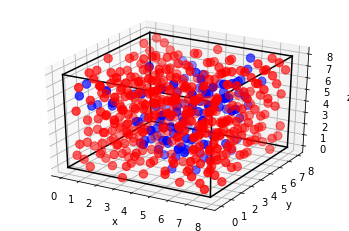

Processed configuration 28. Timestamp = Atoms. Timestep: 113500

500/1 - 0s - loss: 0.3453 - accuracy: 0.8660

Test accuracy: 0.866


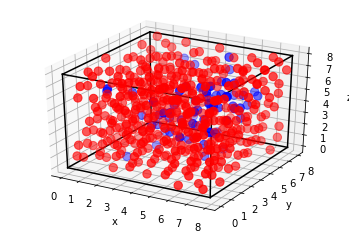

Processed configuration 29. Timestamp = Atoms. Timestep: 114000

500/1 - 0s - loss: 0.2159 - accuracy: 0.9480

Test accuracy: 0.948


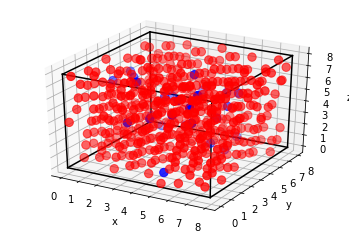

Processed configuration 30. Timestamp = Atoms. Timestep: 114500

500/1 - 0s - loss: 0.1155 - accuracy: 0.9640

Test accuracy: 0.964


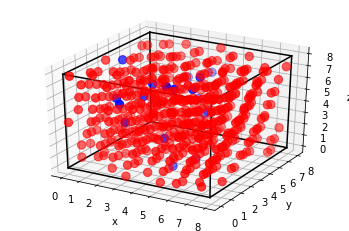

Processed configuration 31. Timestamp = Atoms. Timestep: 115000

500/1 - 0s - loss: 0.1106 - accuracy: 0.9760

Test accuracy: 0.976


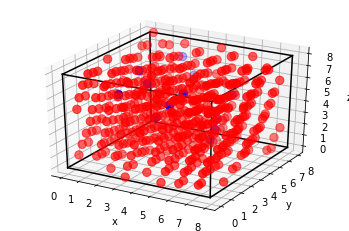

Processed configuration 32. Timestamp = Atoms. Timestep: 115500

500/1 - 0s - loss: 0.0578 - accuracy: 0.9820

Test accuracy: 0.982


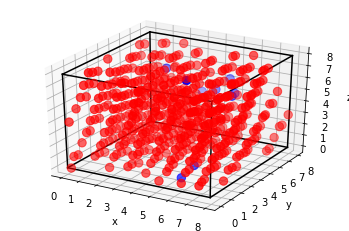

Processed configuration 33. Timestamp = Atoms. Timestep: 116000

500/1 - 0s - loss: 0.0480 - accuracy: 0.9900

Test accuracy: 0.99


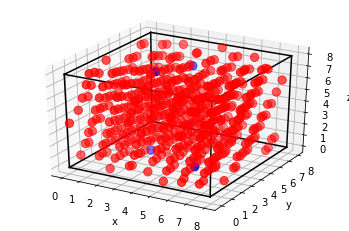

Processed configuration 34. Timestamp = Atoms. Timestep: 116500

500/1 - 0s - loss: 0.0543 - accuracy: 0.9880

Test accuracy: 0.988


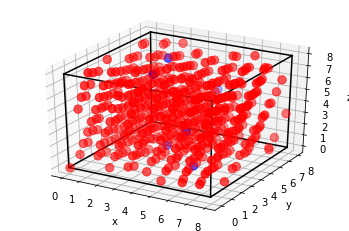

Processed configuration 35. Timestamp = Atoms. Timestep: 117000

500/1 - 1s - loss: 0.0640 - accuracy: 0.9880

Test accuracy: 0.988


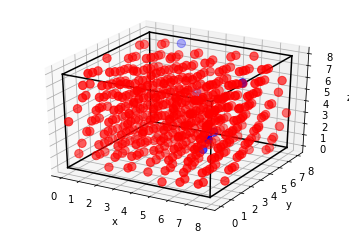

Processed configuration 36. Timestamp = Atoms. Timestep: 117500

500/1 - 0s - loss: 0.0730 - accuracy: 0.9900

Test accuracy: 0.99


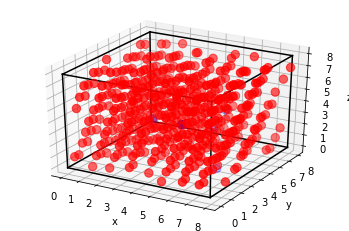

Processed configuration 37. Timestamp = Atoms. Timestep: 118000

500/1 - 0s - loss: 0.0557 - accuracy: 0.9880

Test accuracy: 0.988


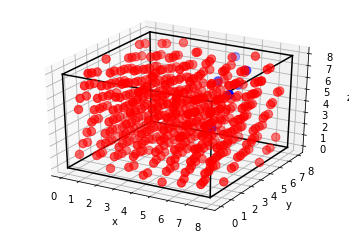

Processed configuration 38. Timestamp = Atoms. Timestep: 118500

500/1 - 0s - loss: 0.0607 - accuracy: 0.9860

Test accuracy: 0.986


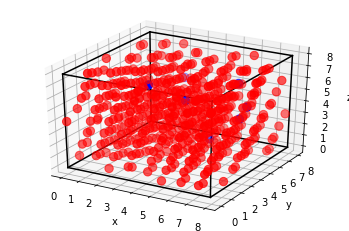

Processed configuration 39. Timestamp = Atoms. Timestep: 119000

500/1 - 0s - loss: 0.0708 - accuracy: 0.9900

Test accuracy: 0.99


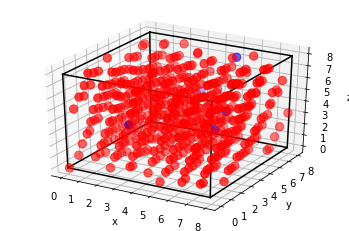

Processed configuration 40. Timestamp = Atoms. Timestep: 119500

500/1 - 0s - loss: 0.0630 - accuracy: 0.9900

Test accuracy: 0.99


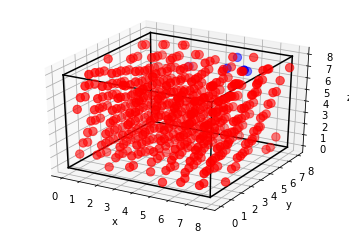

Processed configuration 41. Timestamp = Atoms. Timestep: 120000

500/1 - 0s - loss: 0.1168 - accuracy: 0.9800

Test accuracy: 0.98


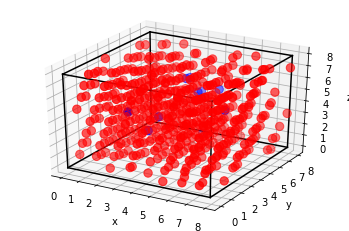

Processed configuration 42. Timestamp = Atoms. Timestep: 120500

500/1 - 0s - loss: 0.0464 - accuracy: 0.9940

Test accuracy: 0.994


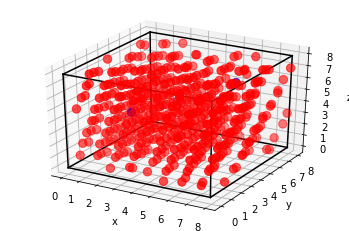

Processed configuration 43. Timestamp = Atoms. Timestep: 121000

500/1 - 0s - loss: 0.0539 - accuracy: 0.9980

Test accuracy: 0.998


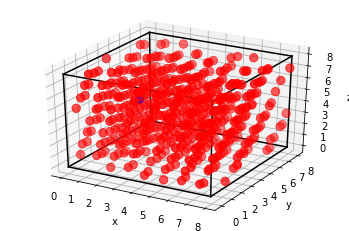

Processed configuration 44. Timestamp = Atoms. Timestep: 121500

500/1 - 0s - loss: 0.0721 - accuracy: 0.9960

Test accuracy: 0.996


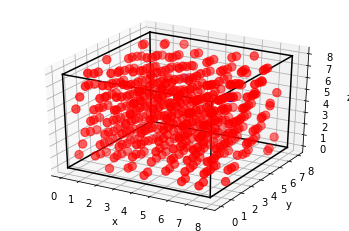

Processed configuration 45. Timestamp = Atoms. Timestep: 122000

500/1 - 0s - loss: 0.0884 - accuracy: 0.9940

Test accuracy: 0.994


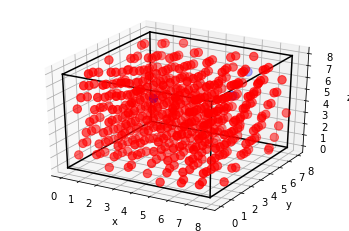

Processed configuration 46. Timestamp = Atoms. Timestep: 122500

500/1 - 0s - loss: 0.0617 - accuracy: 0.9920

Test accuracy: 0.992


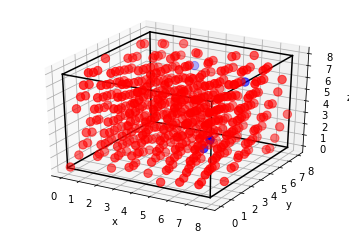

Processed configuration 47. Timestamp = Atoms. Timestep: 123000

500/1 - 0s - loss: 0.0407 - accuracy: 0.9940

Test accuracy: 0.994


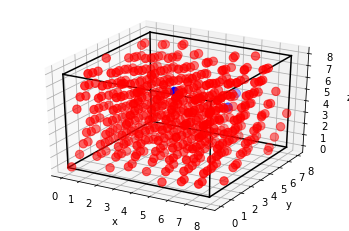

Processed configuration 48. Timestamp = Atoms. Timestep: 123500

500/1 - 0s - loss: 0.0604 - accuracy: 0.9940

Test accuracy: 0.994


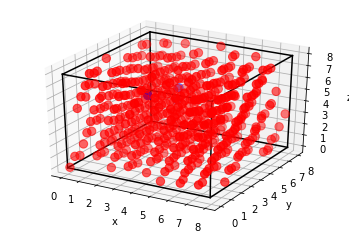

Processed configuration 49. Timestamp = Atoms. Timestep: 124000

500/1 - 0s - loss: 0.0587 - accuracy: 0.9980

Test accuracy: 0.998


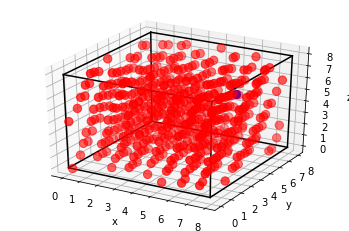

Processed configuration 50. Timestamp = Atoms. Timestep: 124500

500/1 - 0s - loss: 0.0540 - accuracy: 0.9900

Test accuracy: 0.99


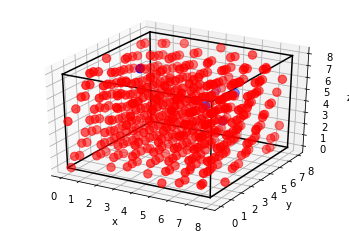

Processed configuration 51. Timestamp = Atoms. Timestep: 125000

500/1 - 0s - loss: 0.0429 - accuracy: 0.9940

Test accuracy: 0.994


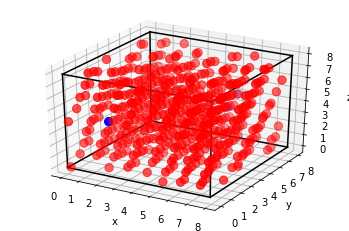

Processed configuration 52. Timestamp = Atoms. Timestep: 125500

500/1 - 0s - loss: 0.0779 - accuracy: 0.9960

Test accuracy: 0.996


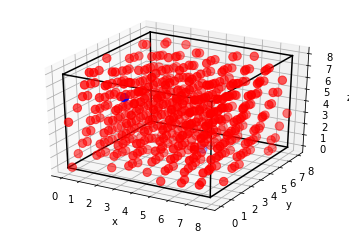

Processed configuration 53. Timestamp = Atoms. Timestep: 126000

500/1 - 0s - loss: 0.0584 - accuracy: 0.9940

Test accuracy: 0.994


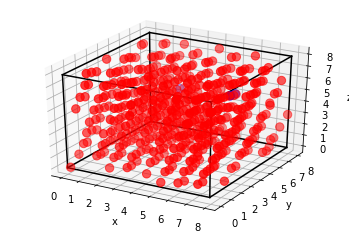

Processed configuration 54. Timestamp = Atoms. Timestep: 126500

500/1 - 0s - loss: 0.0571 - accuracy: 0.9980

Test accuracy: 0.998


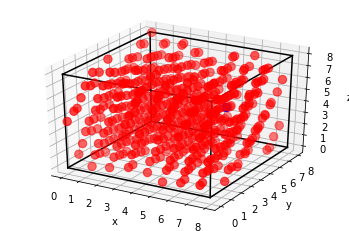

Processed configuration 55. Timestamp = Atoms. Timestep: 127000

500/1 - 0s - loss: 0.0975 - accuracy: 0.9920

Test accuracy: 0.992


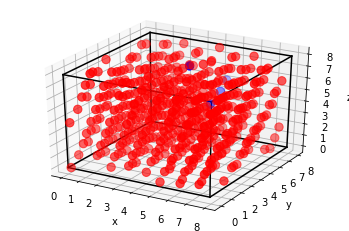

Processed configuration 56. Timestamp = Atoms. Timestep: 127500

500/1 - 0s - loss: 0.0597 - accuracy: 0.9940

Test accuracy: 0.994


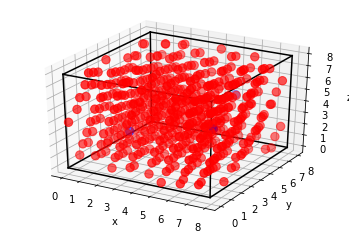

Processed configuration 57. Timestamp = Atoms. Timestep: 128000

500/1 - 0s - loss: 0.0801 - accuracy: 0.9900

Test accuracy: 0.99


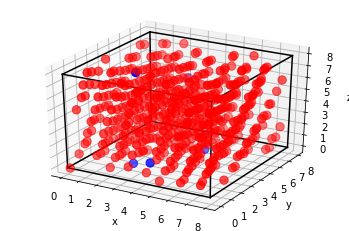

Processed configuration 58. Timestamp = Atoms. Timestep: 128500

500/1 - 0s - loss: 0.0685 - accuracy: 0.9900

Test accuracy: 0.99


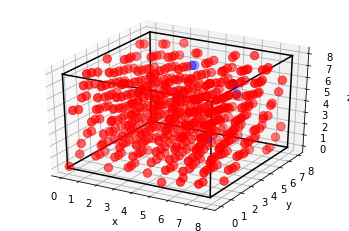

Processed configuration 59. Timestamp = Atoms. Timestep: 129000

500/1 - 0s - loss: 0.1241 - accuracy: 0.9960

Test accuracy: 0.996


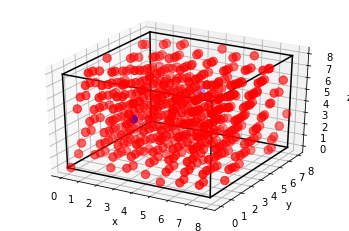

Processed configuration 60. Timestamp = Atoms. Timestep: 129500

500/1 - 0s - loss: 0.0699 - accuracy: 0.9900

Test accuracy: 0.99


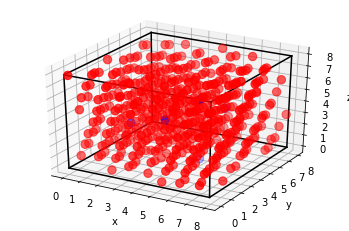

Processed configuration 61. Timestamp = Atoms. Timestep: 130000

500/1 - 0s - loss: 0.0604 - accuracy: 0.9900

Test accuracy: 0.99


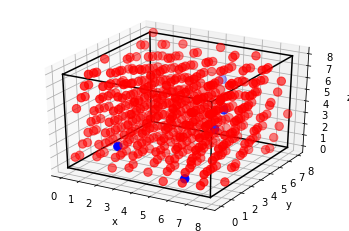

Processed configuration 62. Timestamp = Atoms. Timestep: 130500

500/1 - 0s - loss: 0.0606 - accuracy: 0.9940

Test accuracy: 0.994


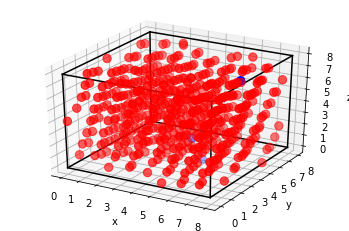

Processed configuration 63. Timestamp = Atoms. Timestep: 131000

500/1 - 0s - loss: 0.0541 - accuracy: 0.9940

Test accuracy: 0.994


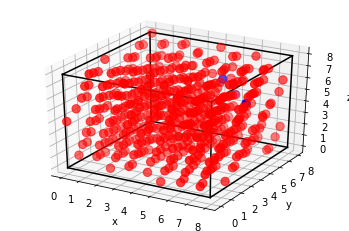

Processed configuration 64. Timestamp = Atoms. Timestep: 131500

500/1 - 0s - loss: 0.0825 - accuracy: 0.9900

Test accuracy: 0.99


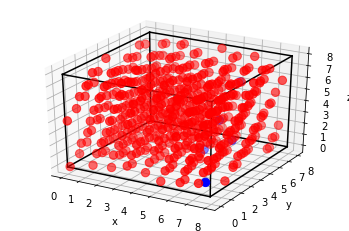

Processed configuration 65. Timestamp = Atoms. Timestep: 132000

500/1 - 0s - loss: 0.1123 - accuracy: 0.9820

Test accuracy: 0.982


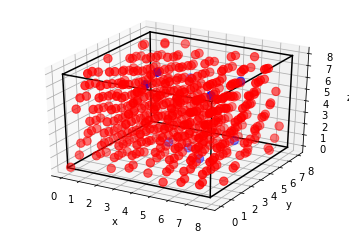

Processed configuration 66. Timestamp = Atoms. Timestep: 132500

500/1 - 0s - loss: 0.0423 - accuracy: 0.9880

Test accuracy: 0.988


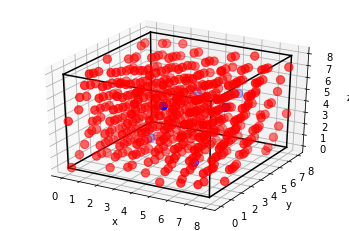

Processed configuration 67. Timestamp = Atoms. Timestep: 133000

500/1 - 0s - loss: 0.0797 - accuracy: 0.9880

Test accuracy: 0.988


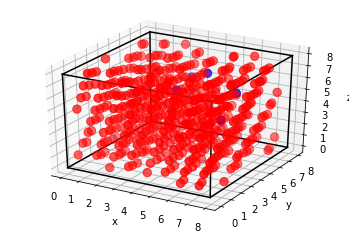

Processed configuration 68. Timestamp = Atoms. Timestep: 133500

500/1 - 0s - loss: 0.0680 - accuracy: 0.9840

Test accuracy: 0.984


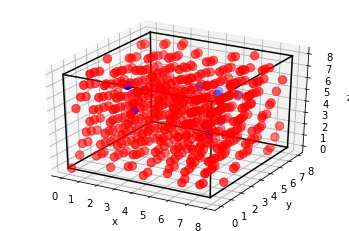

Processed configuration 69. Timestamp = Atoms. Timestep: 134000

500/1 - 0s - loss: 0.0595 - accuracy: 0.9940

Test accuracy: 0.994


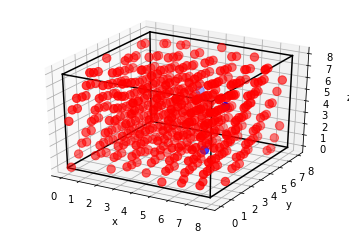

Processed configuration 70. Timestamp = Atoms. Timestep: 134500

500/1 - 0s - loss: 0.0973 - accuracy: 0.9900

Test accuracy: 0.99


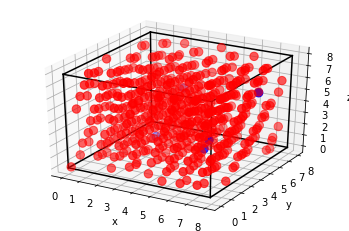

Processed configuration 71. Timestamp = Atoms. Timestep: 135000

500/1 - 0s - loss: 0.0554 - accuracy: 0.9980

Test accuracy: 0.998


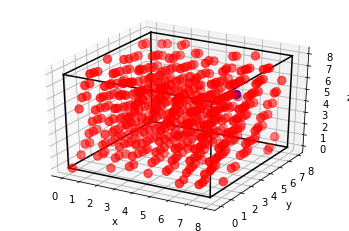

Processed configuration 72. Timestamp = Atoms. Timestep: 135500

500/1 - 0s - loss: 0.0616 - accuracy: 0.9920

Test accuracy: 0.992


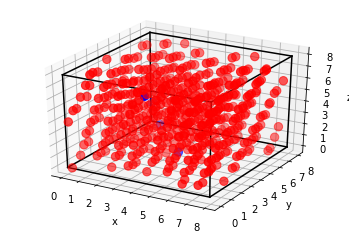

Processed configuration 73. Timestamp = Atoms. Timestep: 136000

500/1 - 0s - loss: 0.0591 - accuracy: 0.9960

Test accuracy: 0.996


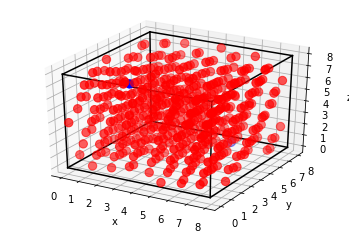

Processed configuration 74. Timestamp = Atoms. Timestep: 136500

500/1 - 0s - loss: 0.0996 - accuracy: 0.9860

Test accuracy: 0.986


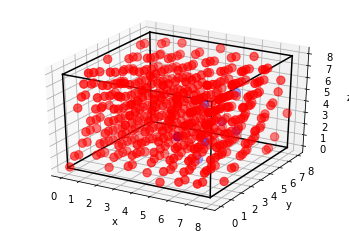

Processed configuration 75. Timestamp = Atoms. Timestep: 137000

500/1 - 0s - loss: 0.0642 - accuracy: 0.9960

Test accuracy: 0.996


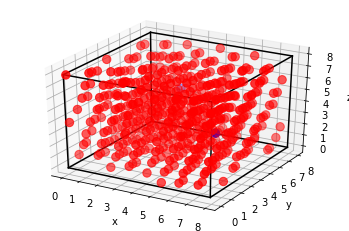

Processed configuration 76. Timestamp = Atoms. Timestep: 137500

500/1 - 0s - loss: 0.0580 - accuracy: 0.9860

Test accuracy: 0.986


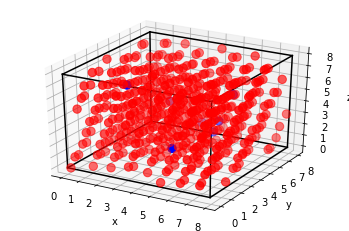

Processed configuration 77. Timestamp = Atoms. Timestep: 138000

500/1 - 0s - loss: 0.0629 - accuracy: 0.9900

Test accuracy: 0.99


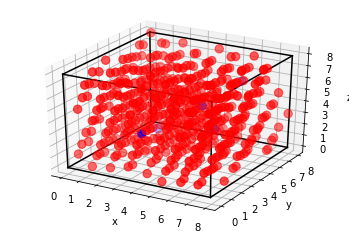

Processed configuration 78. Timestamp = Atoms. Timestep: 138500

500/1 - 0s - loss: 0.0598 - accuracy: 0.9980

Test accuracy: 0.998


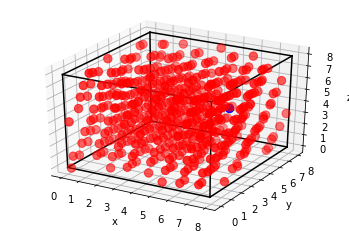

Processed configuration 79. Timestamp = Atoms. Timestep: 139000

500/1 - 0s - loss: 0.0521 - accuracy: 0.9940

Test accuracy: 0.994


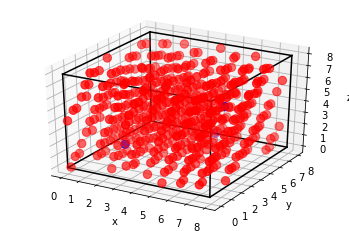

Processed configuration 80. Timestamp = Atoms. Timestep: 139500

500/1 - 0s - loss: 0.0511 - accuracy: 0.9960

Test accuracy: 0.996


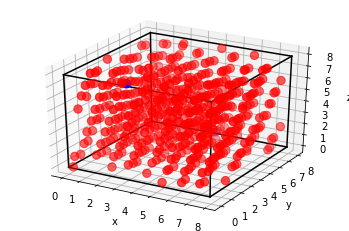

Processed configuration 81. Timestamp = Atoms. Timestep: 140000

500/1 - 0s - loss: 0.0565 - accuracy: 0.9900

Test accuracy: 0.99


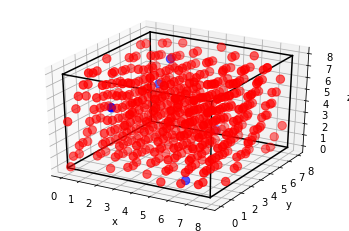

Processed configuration 82. Timestamp = Atoms. Timestep: 140500

500/1 - 0s - loss: 0.0695 - accuracy: 0.9840

Test accuracy: 0.984


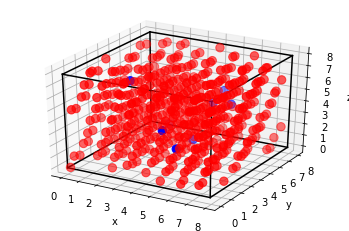

Processed configuration 83. Timestamp = Atoms. Timestep: 141000

500/1 - 0s - loss: 0.0683 - accuracy: 0.9920

Test accuracy: 0.992


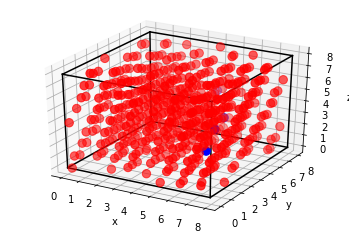

Processed configuration 84. Timestamp = Atoms. Timestep: 141500

500/1 - 0s - loss: 0.0476 - accuracy: 0.9960

Test accuracy: 0.996


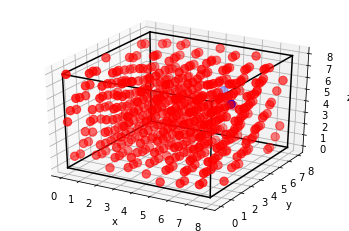

Processed configuration 85. Timestamp = Atoms. Timestep: 142000

500/1 - 0s - loss: 0.0693 - accuracy: 0.9980

Test accuracy: 0.998


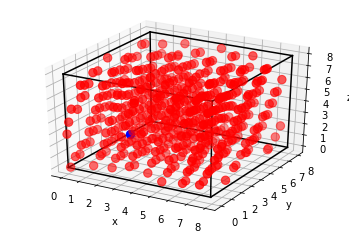

Processed configuration 86. Timestamp = Atoms. Timestep: 142500

500/1 - 0s - loss: 0.0622 - accuracy: 0.9940

Test accuracy: 0.994


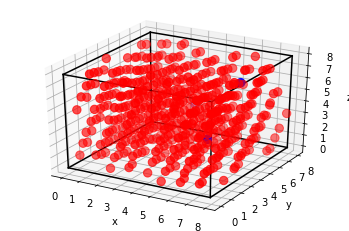

Processed configuration 87. Timestamp = Atoms. Timestep: 143000

500/1 - 0s - loss: 0.0523 - accuracy: 0.9920

Test accuracy: 0.992


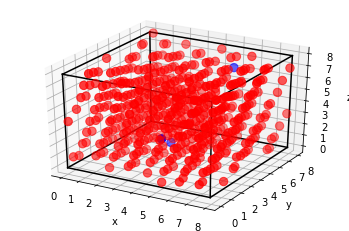

Processed configuration 88. Timestamp = Atoms. Timestep: 143500

500/1 - 0s - loss: 0.0616 - accuracy: 0.9960

Test accuracy: 0.996


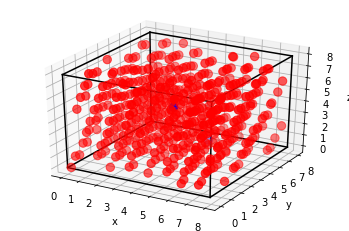

Processed configuration 89. Timestamp = Atoms. Timestep: 144000

500/1 - 0s - loss: 0.0535 - accuracy: 0.9960

Test accuracy: 0.996


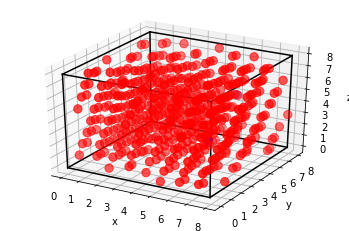

Processed configuration 90. Timestamp = Atoms. Timestep: 144500

500/1 - 0s - loss: 0.0802 - accuracy: 0.9780

Test accuracy: 0.978


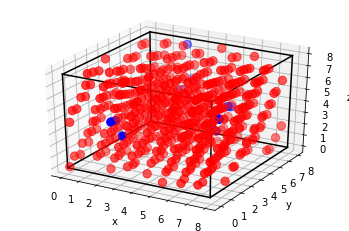

Processed configuration 91. Timestamp = Atoms. Timestep: 145000

500/1 - 0s - loss: 0.0715 - accuracy: 0.9880

Test accuracy: 0.988


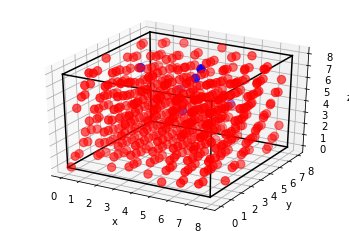

Processed configuration 92. Timestamp = Atoms. Timestep: 145500

500/1 - 0s - loss: 0.0888 - accuracy: 0.9860

Test accuracy: 0.986


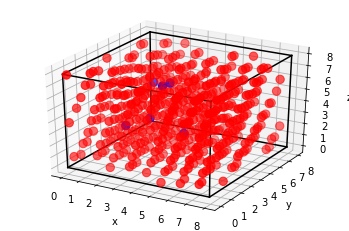

Processed configuration 93. Timestamp = Atoms. Timestep: 146000

500/1 - 0s - loss: 0.0548 - accuracy: 0.9960

Test accuracy: 0.996


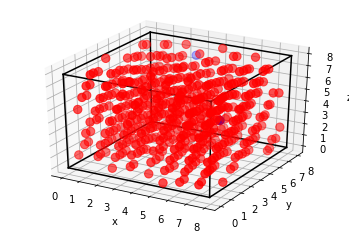

Processed configuration 94. Timestamp = Atoms. Timestep: 146500

500/1 - 0s - loss: 0.0612 - accuracy: 0.9880

Test accuracy: 0.988


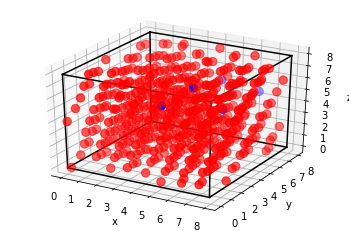

Processed configuration 95. Timestamp = Atoms. Timestep: 147000

500/1 - 0s - loss: 0.0647 - accuracy: 0.9900

Test accuracy: 0.99


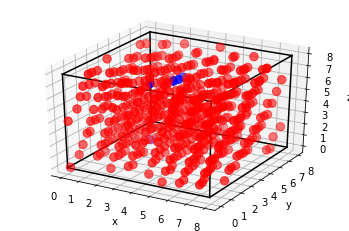

Processed configuration 96. Timestamp = Atoms. Timestep: 147500

500/1 - 0s - loss: 0.0467 - accuracy: 0.9960

Test accuracy: 0.996


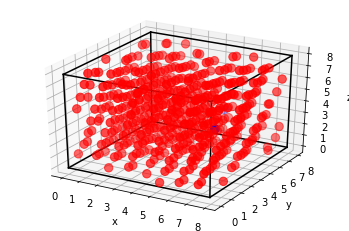

Processed configuration 97. Timestamp = Atoms. Timestep: 148000

500/1 - 0s - loss: 0.0604 - accuracy: 0.9920

Test accuracy: 0.992


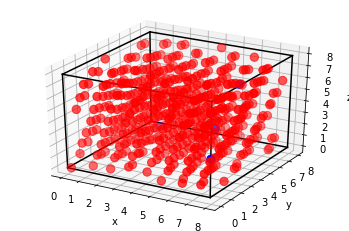

Processed configuration 98. Timestamp = Atoms. Timestep: 148500

500/1 - 0s - loss: 0.0573 - accuracy: 0.9840

Test accuracy: 0.984


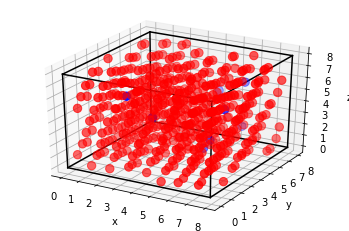

Processed configuration 99. Timestamp = Atoms. Timestep: 149000

500/1 - 0s - loss: 0.0688 - accuracy: 0.9920

Test accuracy: 0.992


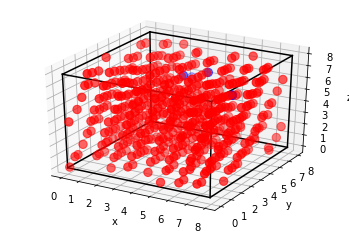

Processed configuration 100. Timestamp = Atoms. Timestep: 149500

500/1 - 0s - loss: 0.0503 - accuracy: 0.9940

Test accuracy: 0.994


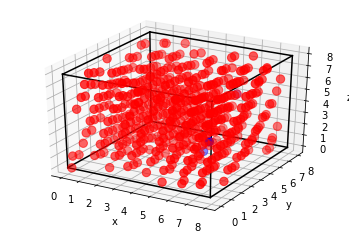

Processed configuration 101. Timestamp = Atoms. Timestep: 150000

Total time to constructs descriptors = 489.44407629966736 s. Total time to make predictions = 110.83674478530884 s.
Average test accuracy = 0.8964752489977544


In [192]:
sc,lc=sol_or_liq(file,l,L,d,c,t)